# RDKit

In [31]:
%pip install rdkit -q

������ ������� ��࠭��: 1251
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [32]:
import rdkit
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import AllChem, rdCoordGen

### Draw one molecule

In [33]:
IPythonConsole.drawOptions.useDefaultAtomPalette()

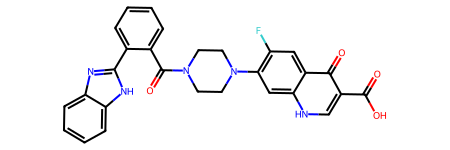

In [34]:
m = Chem.MolFromSmiles('O=C(O)c1c[nH]c2cc(N3CCN(C(=O)c4ccccc4-c4nc5ccccc5[nH]4)CC3)c(F)cc2c1=O')
m

In [35]:
IPythonConsole.drawOptions.useBWAtomPalette()
m
IPythonConsole.drawOptions.useDefaultAtomPalette()

### Draw molecule by template

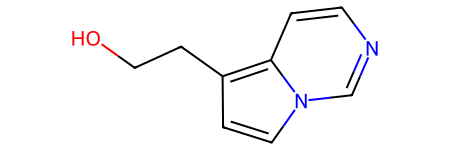

In [36]:
m = Chem.MolFromSmiles('OCCc1ccn2cnccc12')
m

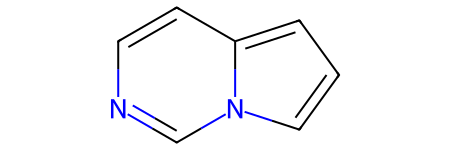

In [37]:
template = Chem.MolFromSmiles('c1nccc2n1ccc2')
AllChem.Compute2DCoords(template)
template

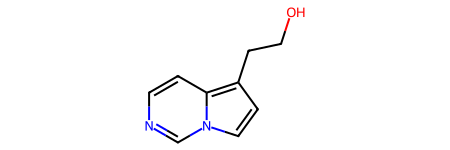

In [38]:
m = Chem.MolFromSmiles('OCCc1ccn2cnccc12')
AllChem.GenerateDepictionMatching2DStructure(m, template)
m

### Draw a set of molecules

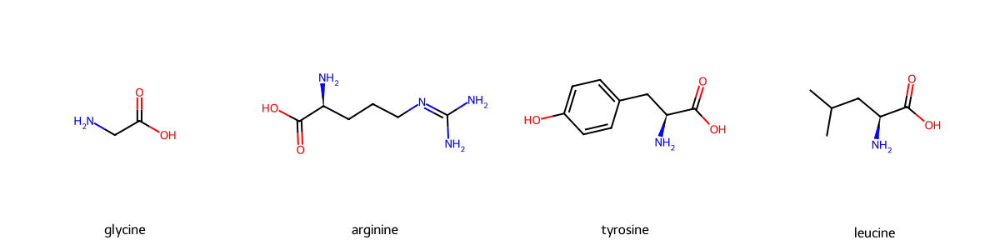

In [39]:
smiles = ['C(C(=O)O)N', 'C(C[C@@H](C(=O)O)N)CN=C(N)N', 'C1=CC(=CC=C1C[C@@H](C(=O)O)N)O', 'CC(C)C[C@@H](C(=O)O)N']
labels = ['glycine', 'arginine', 'tyrosine', 'leucine']

ms = [Chem.MolFromSmiles(smi) for smi in smiles]

Draw.MolsToGridImage(ms, molsPerRow=4, subImgSize=(300,300), legends=labels)

You can set name with SetProp if you want names to be attached to molecules.

In [40]:
for i in range(len(ms)):
  ms[i].SetProp("_Name", labels[i])

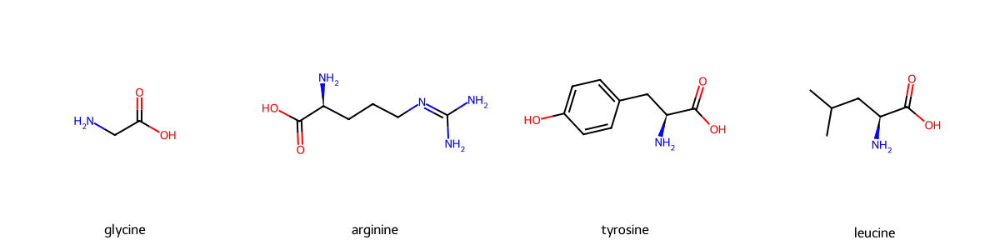

In [41]:
Draw.MolsToGridImage(ms, molsPerRow=4, subImgSize=(300,300), legends=[x.GetProp("_Name") for x in ms])

### Highlight molecule substructures

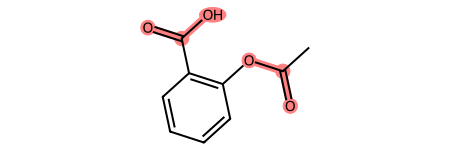

In [42]:
m = Chem.MolFromSmiles('c1cc(C(=O)O)c(OC(=O)C)cc1')
substructure = Chem.MolFromSmarts('C(=O)O')
m.GetSubstructMatches(substructure)
m

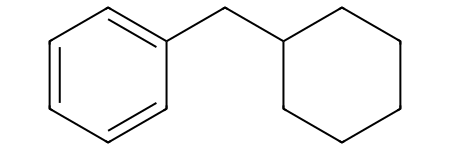

In [43]:
pattern = Chem.MolFromSmiles('c1ccc(CC2CCCCC2)cc1')
pattern

In [44]:
mols_list = ['CCC1CC(CCC1=O)C(=O)C1=CC=CC(C)=C1','CCC1CC(CCC1=O)C(=O)C1=CC=CC=C1',\
         'CC(=C)C(C1=CC=CC=C1)S(=O)CC(N)=O','CC1=CC(=CC=C1)C(C1CCC(N)CC1)C(F)(F)F',\
         'CNC1CCC(C2=CC(Cl)=C(Cl)C=C2)C2=CC=CC=C12','CCCOC(C1CCCCC1)C1=CC=C(Cl)C=C1']
mols = [Chem.MolFromSmiles(m) for m in mols_list]

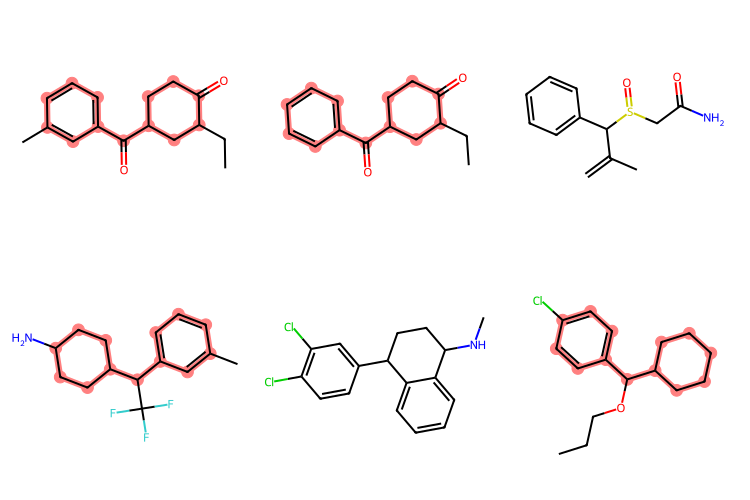

In [45]:
highlights = [m.GetSubstructMatch(pattern) for m in mols]

Draw.MolsToGridImage(mols,
                     highlightAtomLists = highlights,
                     subImgSize=(250,250), useSVG=False)

### Draw similarity between molecules

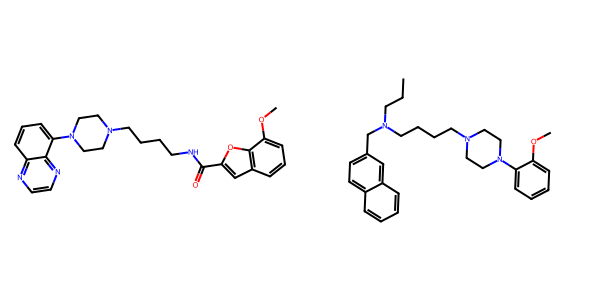

In [46]:
mol = Chem.MolFromSmiles('COc1cccc2cc(C(=O)NCCCCN3CCN(c4cccc5nccnc54)CC3)oc21')
refmol = Chem.MolFromSmiles('CCCN(CCCCN1CCN(c2ccccc2OC)CC1)Cc1ccc2ccccc2c1')
Draw.MolsToGridImage([mol, refmol], molsPerRow=2, subImgSize=(300,300))

In [47]:
from rdkit.Chem.Draw import SimilarityMaps

_, maxweight = SimilarityMaps.GetSimilarityMapForFingerprint(refmol, mol, SimilarityMaps.GetMorganFingerprint)

TypeError: GetSimilarityMapForFingerprint() missing 1 required positional argument: 'draw2d'

### Draw difference between molecules

In [48]:
mol1 = Chem.MolFromSmiles('FC1=CC=C2C(=C1)C=NN2')
mol2 = Chem.MolFromSmiles('CCC1=C2NN=CC2=CC(Cl)=C1')

In [50]:
from rdkit.Chem import rdFMCS

def view_difference(mol1, mol2):
    mcs = rdFMCS.FindMCS([mol1,mol2])
    mcs_mol = Chem.MolFromSmarts(mcs.smartsString)
    match1 = mol1.GetSubstructMatch(mcs_mol)
    target_atm1 = []
    for atom in mol1.GetAtoms():
        if atom.GetIdx() not in match1:
            target_atm1.append(atom.GetIdx())
    match2 = mol2.GetSubstructMatch(mcs_mol)
    target_atm2 = []
    for atom in mol2.GetAtoms():
        if atom.GetIdx() not in match2:
            target_atm2.append(atom.GetIdx())
    return Draw.MolsToGridImage([mol1, mol2],highlightAtomLists=[target_atm1, target_atm2])

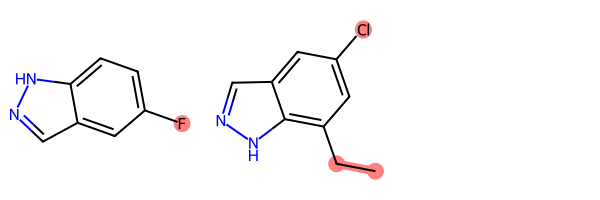

In [51]:
view_difference(mol1,mol2)

### Draw with abbreviations

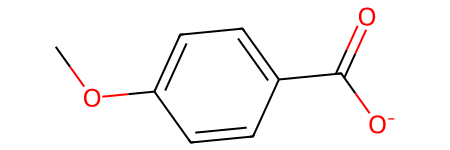

In [52]:
m = Chem.MolFromSmiles('COc1ccc(C(=O)[O-])cc1')
m

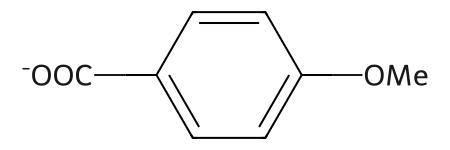

In [53]:
from rdkit.Chem import rdAbbreviations

abbrevs = rdAbbreviations.GetDefaultAbbreviations()
nm = rdAbbreviations.CondenseMolAbbreviations(m,abbrevs)
nm

### Draw molecule on a plot

In [ ]:
mol = Chem.MolFromSmiles('C1CNCCC1C(=O)C')
im = Chem.Draw.MolToImage(mol)

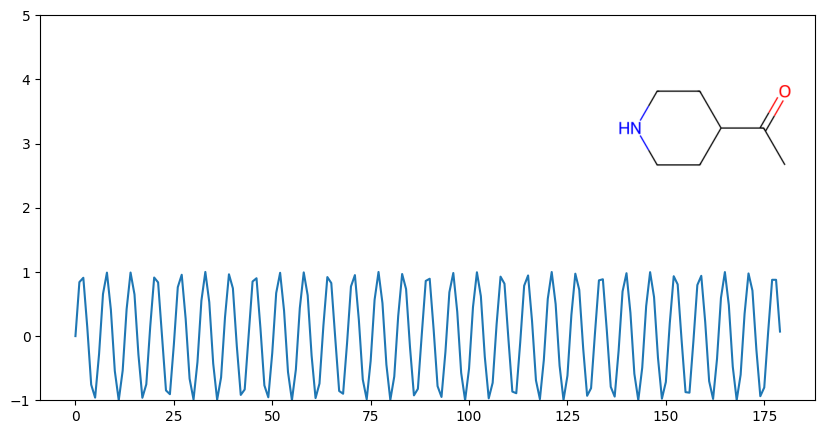

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(0, 180, 1)
y = np.sin(x)

fig = plt.figure(figsize=(10,5))
plt.plot(x, y)
plt.ylim(-1, 5)
ax = plt.axes([0.6, 0.47, 0.38, 0.38], frameon=True)
ax.imshow(im)
ax.axis('off')
plt.show()

### Draw reactions

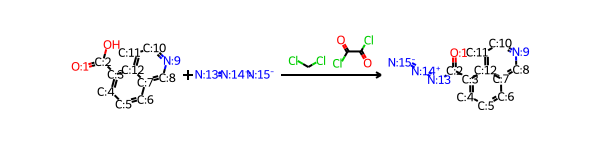

In [ ]:
rxn = AllChem.ReactionFromSmarts('[cH:5]1[cH:6][c:7]2[cH:8][n:9][cH:10][cH:11][c:12]2[c:3]([cH:4]1)[C:2](=[O:1])O.[N-:13]=[N+:14]=[N-:15]>C(Cl)Cl.C(=O)(C(=O)Cl)Cl>[cH:5]1[cH:6][c:7]2[cH:8][n:9][cH:10][cH:11][c:12]2[c:3]([cH:4]1)[C:2](=[O:1])[N:13]=[N+:14]=[N-:15]',useSmiles=True)
rxn

# ChemPlot

In [54]:
!pip install chemplot==1.2.0

������ ������� ��࠭��: 1251
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/779.4 kB ? eta -:--:--
   ---------------------------------------- 779.4/779.4 kB 6.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/7.0 MB ? eta -:--:--
   ----- ---------------------------------- 1.0/7.0 MB 6.3 MB/s eta 0:00:01
   ---------------- ----------------------- 2.9/7.0 MB 8.0 MB/s eta 0:00:01
   ----------------------------- ---------- 5.2/7.0 MB 8.9 MB/s eta 0:00:01
   -------------------------------------- - 6.8/7.0 MB 8.7 MB/s eta 0:00:01
   ---------------------------------------- 7.0/7.0 MB 8.6 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.0 MB ? eta -:--:--
   ------------------------------------ --- 1.8/2.0 MB 8.4 MB/s eta 0:00:01
   ---------------------------------------- 2.0/2.0 MB 8.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.


[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [55]:
from chemplot import Plotter, load_data

from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')

### Visualize chemical space

In [56]:
data_BBBP = load_data("BBBP")
data_BBBP

,smiles,target
0,[Cl].CC(C)NCC(O)COc1cccc2ccccc12,1
1,C(=O)(OC(C)(C)C)CCCc1ccc(cc1)N(CCCl)CCCl,1
2,c12c3c(N4CCN(C)CC4)c(F)cc1c(c(C(O)=O)cn2C(C)CO...,1
3,C1CCN(CC1)Cc1cccc(c1)OCCCNC(=O)C,1
4,Cc1onc(c2ccccc2Cl)c1C(=O)N[C@H]3[C@H]4SC(C)(C)...,1
...,...,...
2034,C1=C(Cl)C(=C(C2=C1NC(=O)C(N2)=O)[N+](=O)[O-])Cl,1
2035,[C@H]3([N]2C1=C(C(=NC=N1)N)N=C2)[C@@H]([C@@H](...,1
2036,[O+]1=N[N](C=C1[N-]C(NC2=CC=CC=C2)=O)C(CC3=CC=...,1
2037,C1=C(OC)C(=CC2=C1C(=[N+](C(=C2CC)C)[NH-])C3=CC...,1


sim_type indicates the similarity type by which the plots are constructed.
The supported similarity types are structural and tailored.
Because a target list has been provided 'tailored' as been selected as sym_type.


c:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\chemplot\chemplot.py:106: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  numeric_target = is_numeric_dtype(df_target.dtypes[0])


For the following SMILES not all descriptors can be computed:
[N+](=[N-])=O.
These SMILES will be removed from the data.


c:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


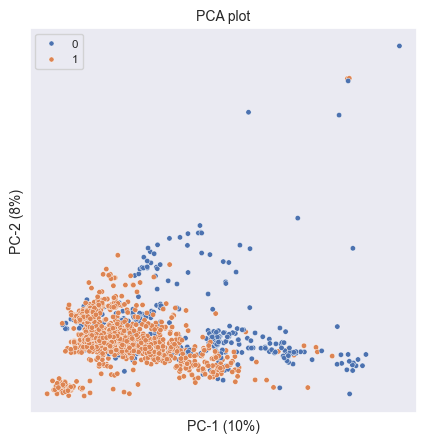

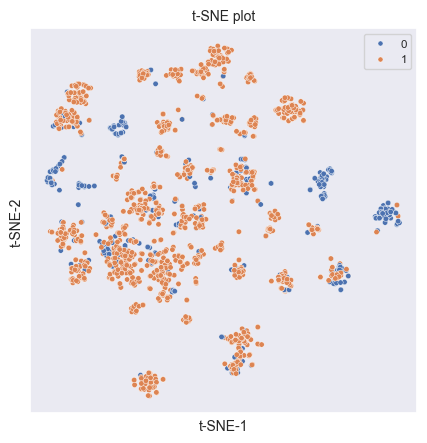

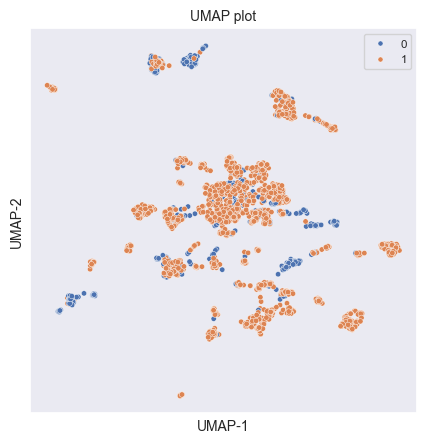

In [57]:
cp_BBBP = Plotter.from_smiles(data_BBBP["smiles"], target=data_BBBP["target"], target_type="C")

cp_BBBP.pca()
cp_BBBP.visualize_plot(size=5);
cp_BBBP.tsne()
cp_BBBP.visualize_plot(size=5);
cp_BBBP.umap()
cp_BBBP.visualize_plot(size=5);

### Chemical space clustering

/usr/local/lib/python3.10/dist-packages/chemplot/chemplot.py:608: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_data.clusters.replace(labels, inplace=True)


<Axes: label='scatter', title={'center': 'UMAP plot'}, xlabel='UMAP-1', ylabel='UMAP-2'>

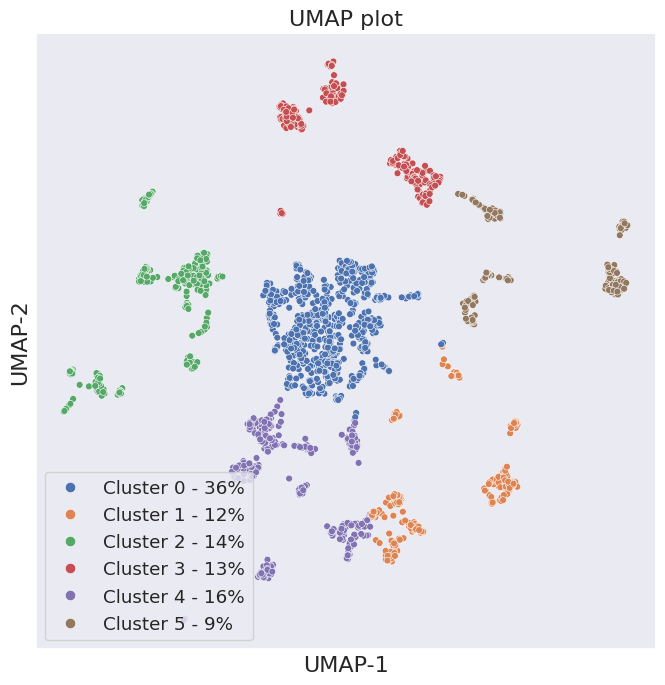

In [ ]:
cp_BBBP.cluster(n_clusters=6)
cp_BBBP.visualize_plot(size=8,clusters=True)

### Interactive plot

In [ ]:
!pip install --upgrade bokeh==2.4.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 72.7 MB/s eta 0:00:00
  Attempting uninstall: bokeh
    Found existing installation: bokeh 3.4.3
    Uninstalling bokeh-3.4.3:
      Successfully uninstalled bokeh-3.4.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
holoviews 1.19.1 requires bokeh>=3.1, but you have bokeh 2.4.3 which is incompatible.
panel 1.4.5 requires bokeh<3.5.0,>=3.4.0, but you have bokeh 2.4.3 which is incompatible.


In [ ]:
from bokeh.io import output_notebook
output_notebook()

In [ ]:
cp_BBBP.interactive_plot(show_plot=True)

Figure(id='1059', ...)

# PyMOL

### Draw small molecule 3D

In [ ]:
%pip install py3Dmol -q

In [ ]:
import py3Dmol

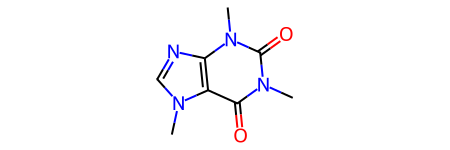

In [ ]:
caffeine = Chem.MolFromSmiles("CN1C=NC2=C1C(=O)N(C(=O)N2C)C")
rdCoordGen.AddCoords(caffeine)
caffeine

In [ ]:
def molecule_to_3d(molecule):
    mol = Chem.Mol(molecule)
    mol = AllChem.AddHs(mol, addCoords=True)
    AllChem.EmbedMolecule(mol)
    AllChem.MMFFOptimizeMolecule(mol)
    return mol

caffeine_3d = molecule_to_3d(caffeine)

In [ ]:
view = py3Dmol.view(
    data=Chem.MolToMolBlock(caffeine_3d),
    style={"stick": {}, "sphere": {"scale": 0.3}}
)
view.zoomTo()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

### Draw macromolecule 3D

In [ ]:
view2 = py3Dmol.view(query='pdb:4Z2E')

view2.setStyle({'cartoon':{'color':'spectrum'}})

view2.render()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
view2.setStyle({'chain':'A'},{'cartoon': {'color': 'black'}})
view2.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
view2.setStyle({'chain':['A','B']},{'cartoon': {'color': 'orange'}})

view2.addLabel('A subunits', {'fontColor':'orange', 'backgroundColor':'lightgray'},
                {'chain': ['A','B']})

view2.setStyle({'chain':['C','D']}, {'cartoon': {'color': 'blue'}})

view2.addLabel('B subunits', {'fontColor':'blue', 'backgroundColor':'lightgray'},
                {'chain': ['C','D']})
view2.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
view2.setStyle({'resn': 'ALA'},{'sphere': {'colorscheme': 'greenCarbon'}})
view2.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

# Forgi (visualize RNA sequence)

In [58]:
!pip install viennarna

������ ������� ��࠭��: 1251
   ---------------------------------------- 0.0/1.9 MB ? eta -:--:--
   ----- ---------------------------------- 0.3/1.9 MB ? eta -:--:--
   --------------------------- ------------ 1.3/1.9 MB 5.6 MB/s eta 0:00:01
   ---------------------------------------- 1.9/1.9 MB 5.1 MB/s eta 0:00:00



[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [59]:
!pip install forgi

������ ������� ��࠭��: 1251
     ---------------------------------------- 0.0/26.6 MB ? eta -:--:--
     ---------------------------------------- 0.0/26.6 MB ? eta -:--:--
     ---------------------------------------- 0.3/26.6 MB ? eta -:--:--
     - -------------------------------------- 1.3/26.6 MB 3.4 MB/s eta 0:00:08
     --- ------------------------------------ 2.4/26.6 MB 4.5 MB/s eta 0:00:06
     ------ --------------------------------- 4.2/26.6 MB 5.1 MB/s eta 0:00:05
     --------- ------------------------------ 6.3/26.6 MB 6.1 MB/s eta 0:00:04
     ------------ --------------------------- 8.4/26.6 MB 6.8 MB/s eta 0:00:03
     --------------- ------------------------ 10.5/26.6 MB 7.3 MB/s eta 0:00:03
     ------------------ --------------------- 12.6/26.6 MB 7.6 MB/s eta 0:00:02
     ---------------------- ----------------- 14.7/26.6 MB 7.8 MB/s eta 0:00:02
     ------------------------ --------------- 16.5/26.6 MB 7.9 MB/s eta 0:00:02
     ---------------------------- --------

  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [135 lines of output]
      fatal: not a git repository (or any of the parent directories): .git
      C:\Users\user\AppData\Local\Programs\Python\Python39\lib\site-packages\setuptools\__init__.py:94: _DeprecatedInstaller: setuptools.installer and fetch_build_eggs are deprecated.
      !!
      
              ********************************************************************************
              Requirements should be satisfied by a PEP 517 installer.
              If you are using pip, you can try `pip install --use-pep517`.
              ********************************************************************************
      
      !!
        dist.fetch_build_eggs(dist.setup_requires)
      INFO:root:running bdist_wheel
      INFO:root:running build
      INFO:root:running build_py
      INFO:root:creating build\lib.win-amd64-cpython-39\forgi
      INFO:root:

In [ ]:
import forgi.visual.mplotlib as fvm
import forgi
import matplotlib.pyplot as plt

In [ ]:
rna_structure = forgi.load_rna("1a4d.pdb")
rna_structure = rna_structure[0]

IndexError: string index out of range

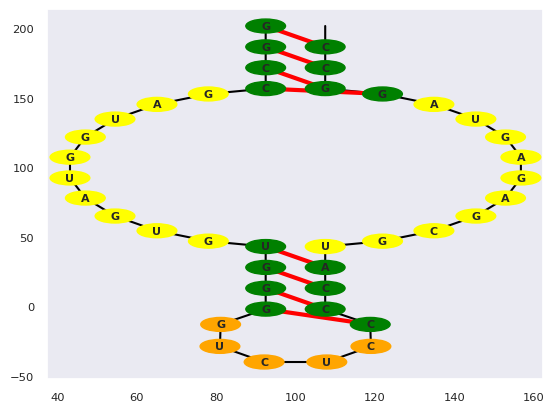

In [ ]:
fig, ax = plt.subplots()
fvm.plot_rna(rna_structure, text_kwargs={"fontsize": 8}, ax=ax)
plt.show()

# ProLIF (visualize target-ligand interactions)

In [ ]:
!pip install prolif

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.6/46.6 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.1/10.1 MB 90.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 73.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.3 MB/s eta 0:00:00


In [ ]:
!pip install MDAnalysis

In [ ]:
import prolif as plf
import MDAnalysis as mda

In [ ]:
protein_h = mda.Universe(f"1kzn_protein.pdb")
ligand_h = mda.Universe(f"1kzn_lig.pdb")

In [ ]:
protein_mol = plf.Molecule.from_mda(protein_h)
ligand_mol = plf.Molecule.from_mda(ligand_h)

In [ ]:
fp = plf.Fingerprint()

In [ ]:
lig_list = [ ligand_mol ]

interactions = fp.run_from_iterable(lig_list, protein_mol)

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
view = fp.plot_lignetwork(lig_list[0])
view